In [ ]:
!wget https://raw.githubusercontent.com/namanvashistha/doctor_strange/master/crime.csv

--2021-01-18 03:26:11--  https://raw.githubusercontent.com/namanvashistha/doctor_strange/master/crime.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2049924 (2.0M) [text/plain]
Saving to: ‘crime.csv.1’

crime.csv.1         100%[===================>]   1.95M  --.-KB/s    in 0.1s    

2021-01-18 03:26:11 (20.3 MB/s) - ‘crime.csv.1’ saved [2049924/2049924]



In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
data = pd.read_csv("crime.csv")
data

,Date,Latitude,Longitude,Magnitude
0,2017-02-06T20:11:14.000Z,38.894376,-76.997556,4
1,2017-06-03T12:54:27.000Z,38.906838,-77.058661,6
2,2017-04-07T00:00:00.000Z,38.960739,-77.018034,16
3,2017-05-31T11:39:56.000Z,38.905151,-77.063998,4
4,2017-07-30T00:00:00.000Z,38.949532,-77.020246,16
...,...,...,...,...
33111,2017-12-23T17:15:25.000Z,38.918640,-77.031953,4
33112,2017-12-30T06:13:28.000Z,38.927417,-77.021727,6
33113,2017-12-30T16:07:46.000Z,38.919739,-77.033395,4
33114,2017-12-30T22:06:45.000Z,38.937766,-76.974186,4


In [86]:
np.random.seed(42)

def euclidean_distance(x1, x2):
    return np.sqrt(np.sum((x1 - x2)**2))

class KMeans():

    def __init__(self, K=5, max_iters=100, plot_steps=False):
        self.K = K
        self.max_iters = max_iters
        self.plot_steps = plot_steps

        # list of sample indices for each cluster
        self.clusters = [[] for _ in range(self.K)]
        # the centers (mean feature vector) for each cluster
        self.centroids = []

    def predict(self, X):
        self.X = X
        self.n_samples, self.n_features = X.shape
        
        # initialize 
        random_sample_idxs = np.random.choice(self.n_samples, self.K, replace=False)
        self.centroids = [self.X[idx] for idx in random_sample_idxs]

        # Optimize clusters
        for _ in range(self.max_iters):
            # Assign samples to closest centroids (create clusters)
            self.clusters = self._create_clusters(self.centroids)
            if self.plot_steps:
                self.plot()

            # Calculate new centroids from the clusters
            centroids_old = self.centroids
            self.centroids = self._get_centroids(self.clusters)
            
            # check if clusters have changed
            if self._is_converged(centroids_old, self.centroids):
                break

            if self.plot_steps:
                self.plot()

        # Classify samples as the index of their clusters
        return self._get_cluster_labels(self.clusters)


    def _get_cluster_labels(self, clusters):
        # each sample will get the label of the cluster it was assigned to
        labels = np.empty(self.n_samples)

        for cluster_idx, cluster in enumerate(clusters):
            for sample_index in cluster:
                labels[sample_index] = cluster_idx
        return labels

    def _create_clusters(self, centroids):
        # Assign the samples to the closest centroids to create clusters
        clusters = [[] for _ in range(self.K)]
        for idx, sample in enumerate(self.X):
            centroid_idx = self._closest_centroid(sample, centroids)
            clusters[centroid_idx].append(idx)
        return clusters

    def _closest_centroid(self, sample, centroids):
        # distance of the current sample to each centroid
        distances = [euclidean_distance(sample, point) for point in centroids]
        closest_index = np.argmin(distances)
        return closest_index

    def _get_centroids(self, clusters):
        # assign mean value of clusters to centroids
        centroids = np.zeros((self.K, self.n_features))
        for cluster_idx, cluster in enumerate(clusters):
            cluster_mean = np.mean(self.X[cluster], axis=0)
            centroids[cluster_idx] = cluster_mean
        return centroids

    def _is_converged(self, centroids_old, centroids):
        # distances between each old and new centroids, fol all centroids
        distances = [euclidean_distance(centroids_old[i], centroids[i]) for i in range(self.K)]
        return sum(distances) == 0

    def plot(self):
        fig, ax = plt.subplots(figsize=(12, 8))

        for i, index in enumerate(self.clusters):
            point = self.X[index].T
            ax.scatter(*point)

        for point in self.centroids:
            ax.scatter(*point, marker="x", color='black', linewidth=2)

        plt.show()
    def cent(self):
        return self.centroids

In [ ]:
data.Magnitude.unique()

array(['4', '6', '16', '12', '8', '10', '2', 'ARSON', '14'], dtype=object)

Text(0, 0.5, 'Longitude')

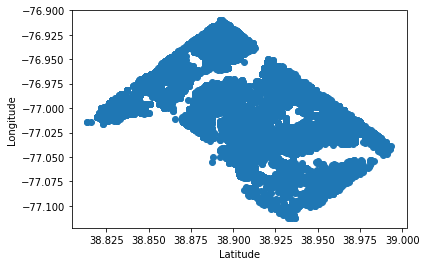

In [ ]:
plt.scatter(data.Latitude,data.Longitude)
plt.xlabel('Latitude')
plt.ylabel('Longitude')

In [ ]:
data.isna().sum()

Date         0
Latitude     0
Longitude    0
Magnitude    0
dtype: int64

In [ ]:
X = data[['Latitude', 'Longitude']]
X = np.array(X)

In [82]:
from sklearn.cluster import KMeans

In [ ]:
import plotly.graph_objects as go

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



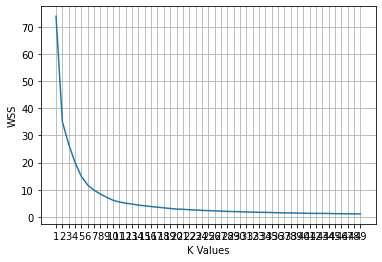

In [ ]:
wss = []
K = []
k_rng = range(1,50)
for k in k_rng:
    km = KMeans(n_clusters=k)
    km.fit(X)
    wss.append(km.inertia_)
    K.append(k)

plt.xlabel('K Values')
plt.ylabel('WSS')
axes= plt.axes()
axes.set_xticks(K)
plt.grid()
plt.plot(k_rng,wss)

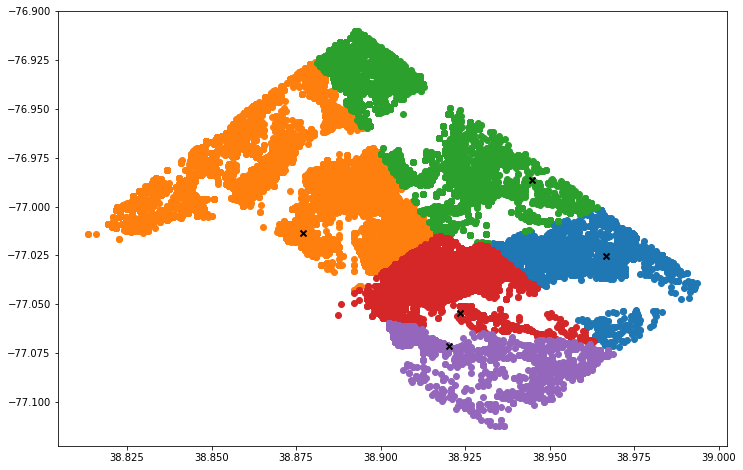

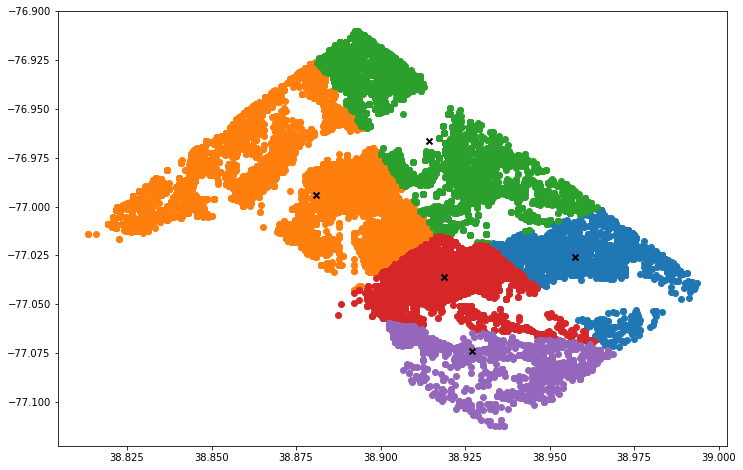

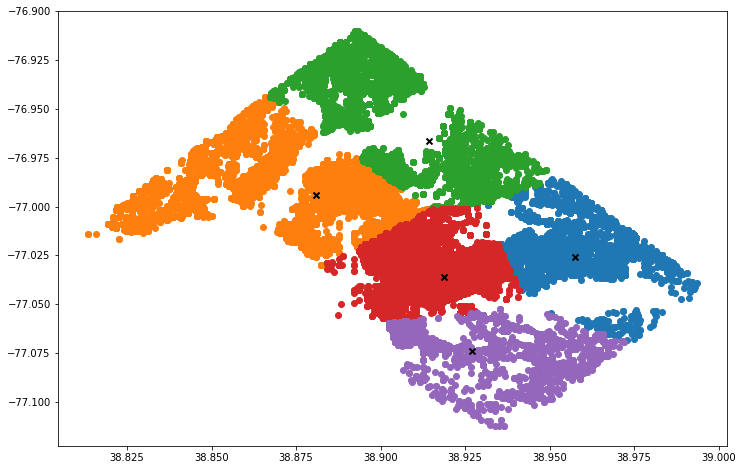

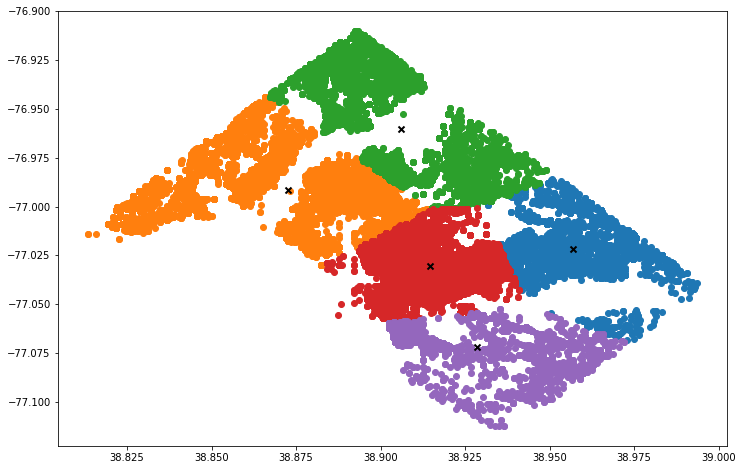

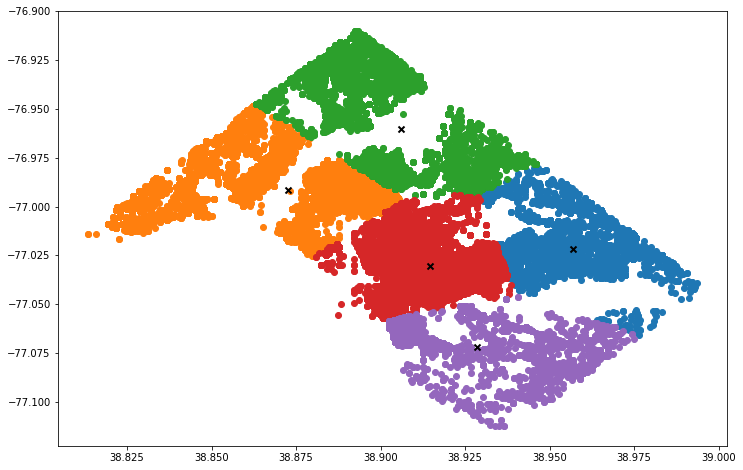

...

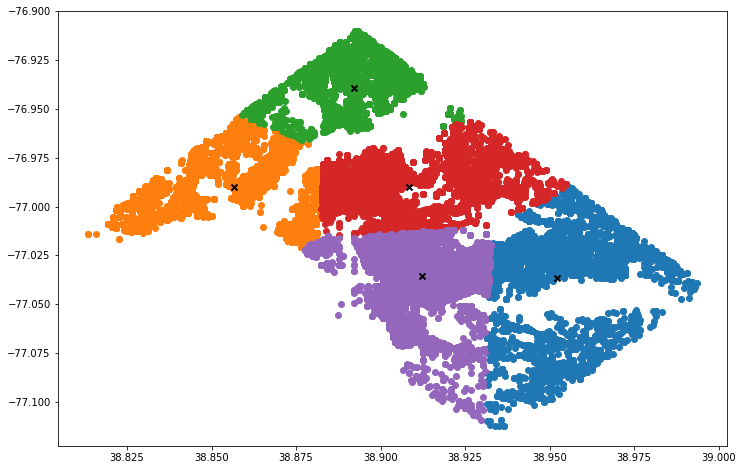

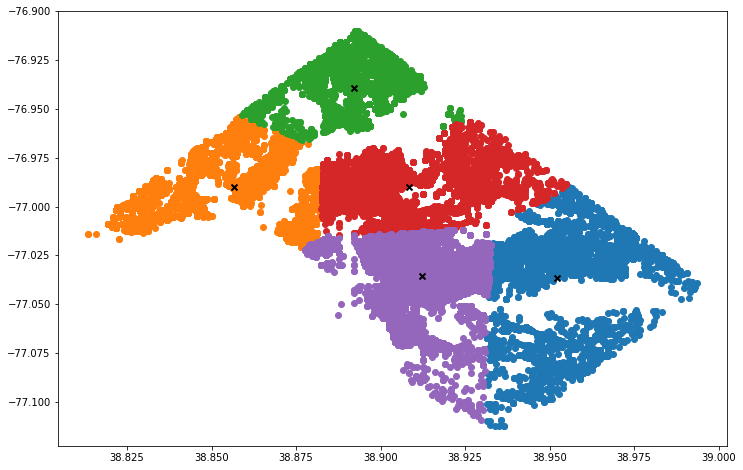

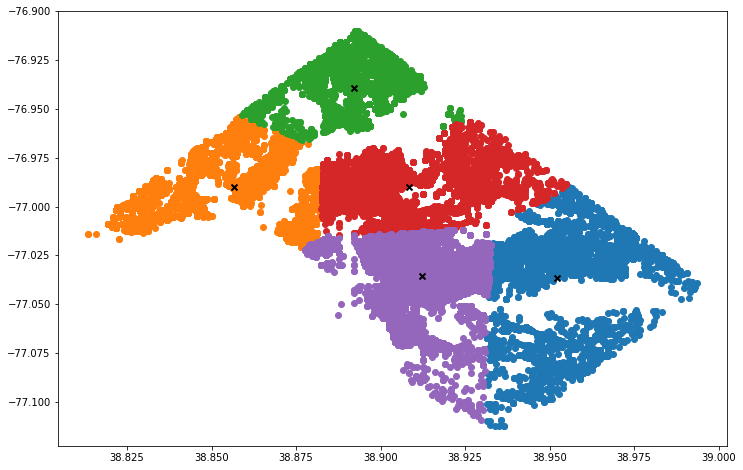

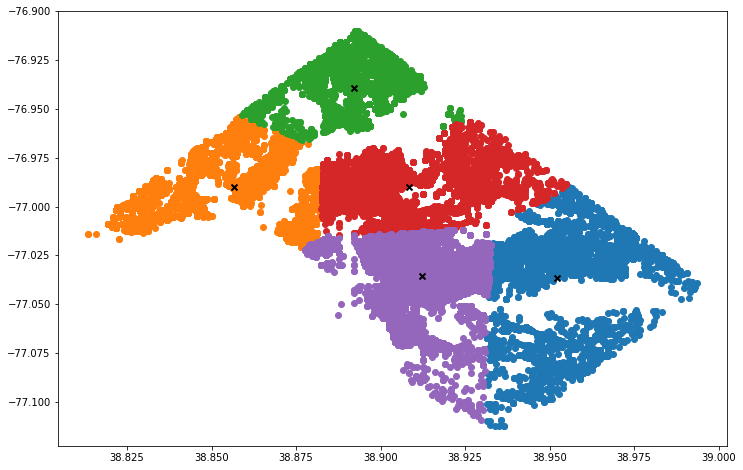

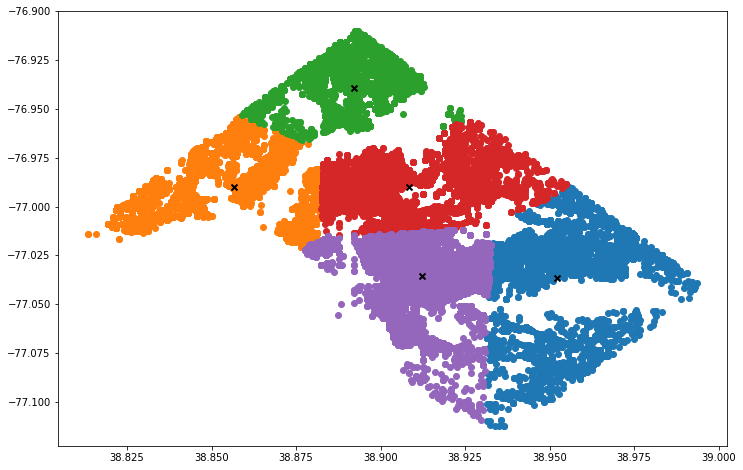

In [ ]:
k = KMeans(K=5, max_iters=150, plot_steps=True)
y_pred = k.predict(X)
k.plot()

In [ ]:
arr = data.Magnitude.unique()

In [ ]:
arr = np.delete(arr, 7)
arr = arr.astype(int)

In [ ]:
avg = np.average(arr)
avg

9.0

In [ ]:
data.Magnitude = data.Magnitude.replace(to_replace ="ARSON", 
                 value ="9") 

In [ ]:
data.Magnitude.unique()

array(['4', '6', '16', '12', '8', '10', '2', '9', '14'], dtype=object)

In [78]:
data['Magnitude'] = data['Magnitude'].astype(int)

In [79]:
data.Magnitude.unique()

array([ 4,  6, 16, 12,  8, 10,  2,  9, 14])

In [80]:
X = data[['Latitude', 'Longitude', 'Magnitude']]
X = np.array(X)

In [81]:
X

array([[ 38.89437604, -76.99755622,   4.        ],
       [ 38.90683791, -77.05866107,   6.        ],
       [ 38.96073891, -77.01803392,  16.        ],
       ...,
       [ 38.9197388 , -77.03339489,   4.        ],
       [ 38.93776635, -76.97418624,   4.        ],
       [ 38.95142333, -77.02381136,   6.        ]])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



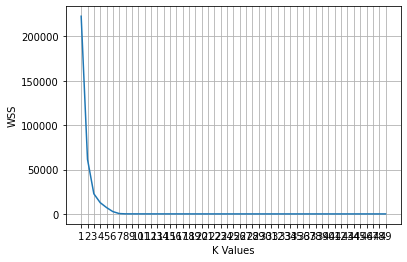

In [83]:
wss = []
K = []
k_rng = range(1,50)
for k in k_rng:
    km = KMeans(n_clusters=k)
    km.fit(X)
    wss.append(km.inertia_)
    K.append(k)

plt.xlabel('K Values')
plt.ylabel('WSS')
axes= plt.axes()
axes.set_xticks(K)
plt.grid()
plt.plot(k_rng,wss)

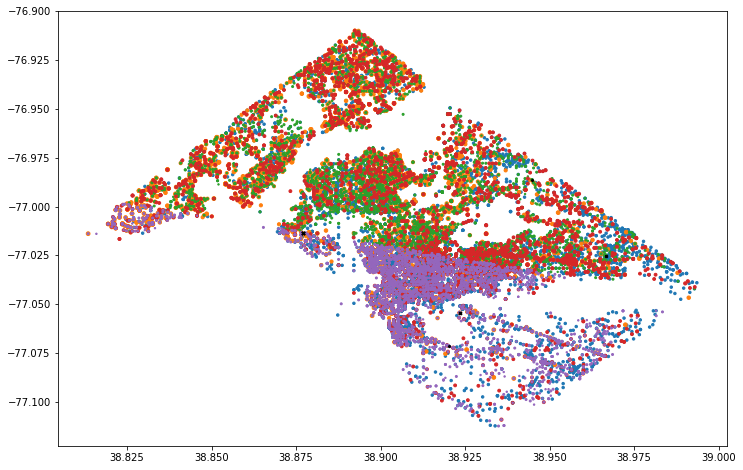

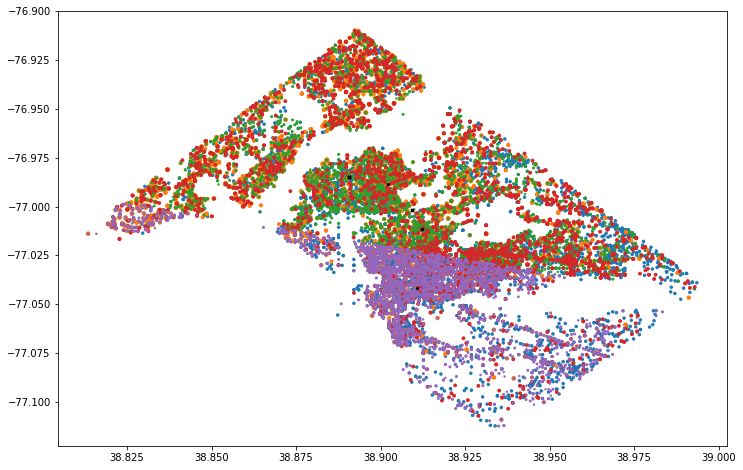

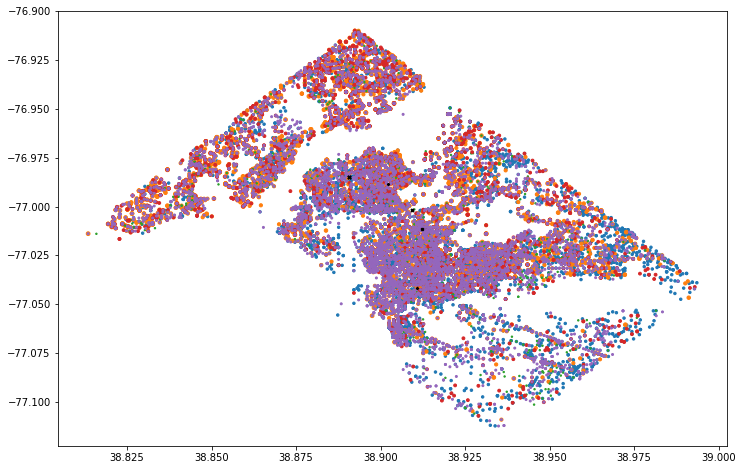

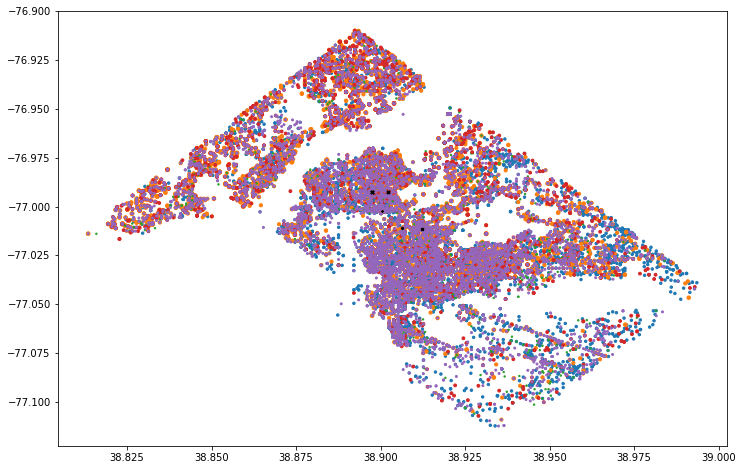

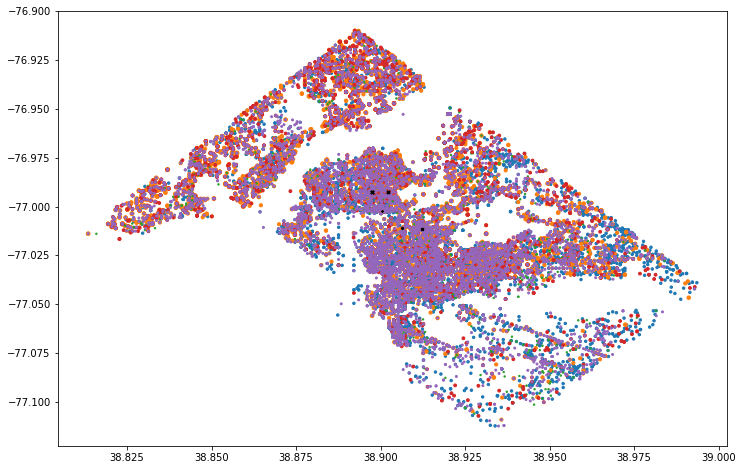

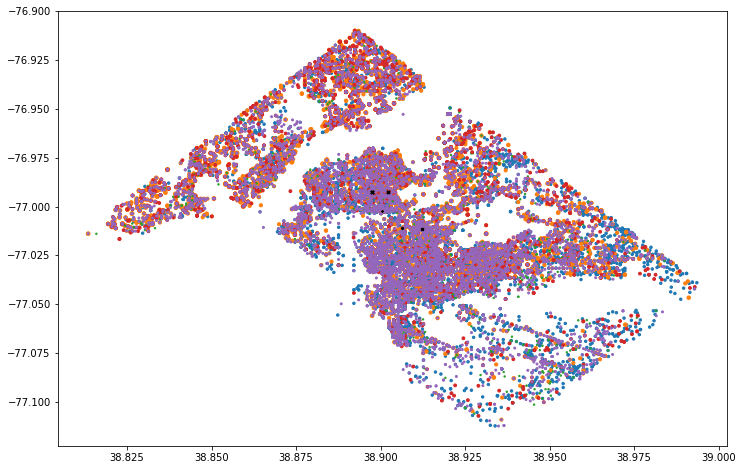

In [87]:
k = KMeans(K=5, max_iters=150, plot_steps=True)
y_pred = k.predict(X)
k.plot()